Generating visualizations...
Total samples: 200
Class 0 samples: 96
Class 1 samples: 104


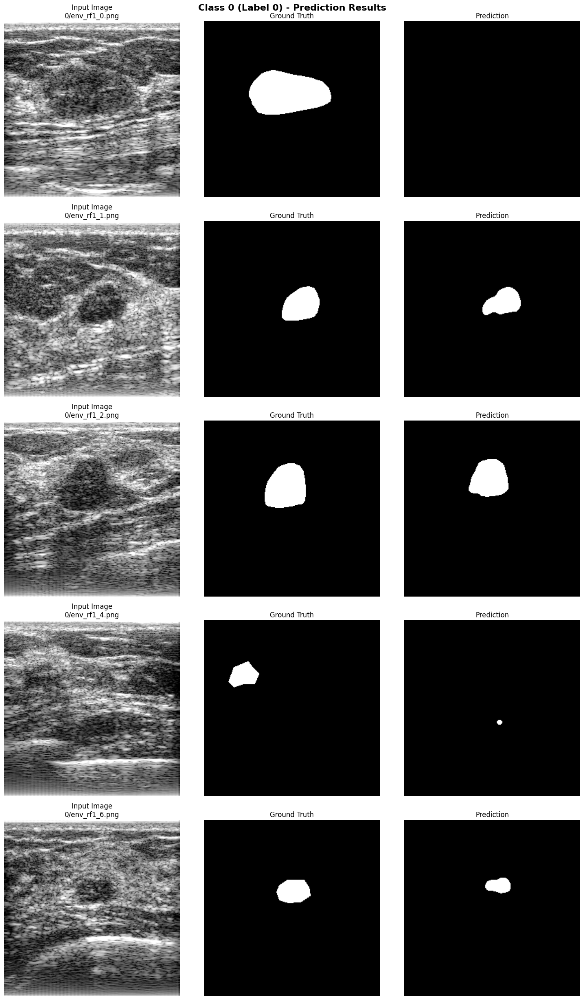

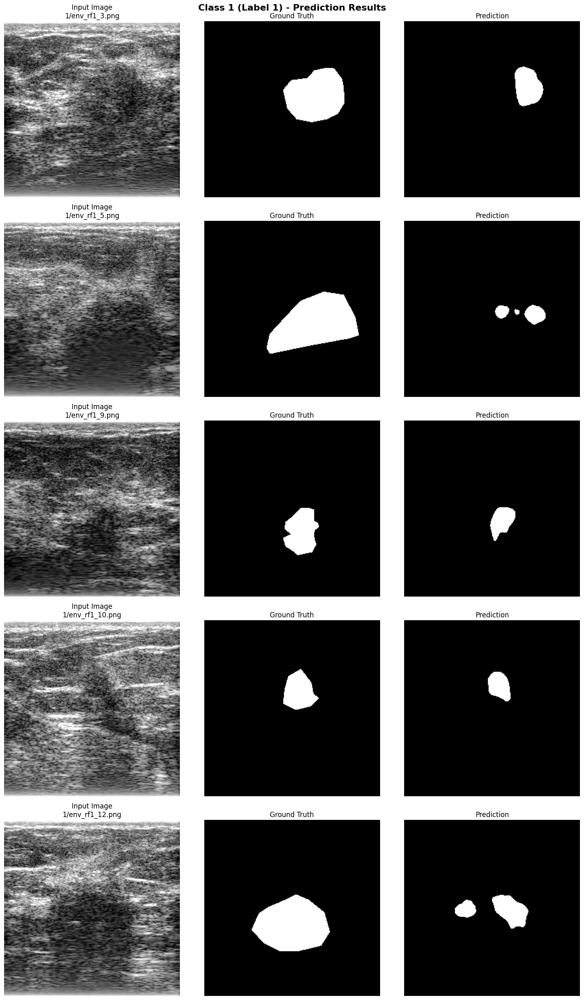

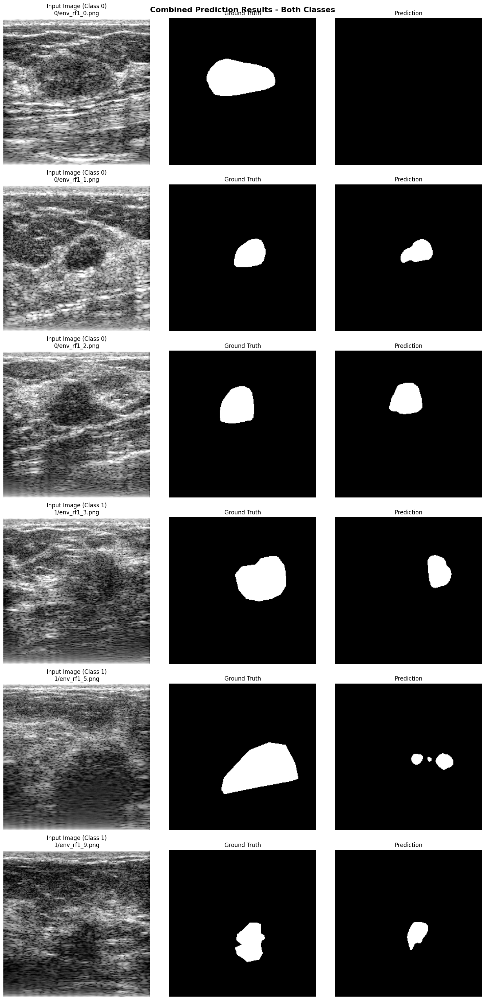

In [4]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from natsort import natsorted
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Configuration
IMG_SIZE = (256, 256)
BATCH_SIZE = 8
MODEL_PATH = "best_model_seg_NEW.pth"
DATA_PATH = "output_images/"
LABELS = ["0", "1"]
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dataset class
class UltrasoundTestDataset(Dataset):
    def __init__(self, data_path):
        self.rf_images = []
        self.roi_masks = []
        self.file_names = []
        self.labels = []  # Store labels for each sample
        valid_extensions = ('.png', '.jpg', '.jpeg')
        
        for label in LABELS:
            rf_path = os.path.join(data_path, label, "rf")
            roi_path = os.path.join(data_path, label, "roi")
            if not os.path.exists(rf_path) or not os.path.exists(roi_path):
                continue

            rf_files = natsorted([f for f in os.listdir(rf_path) if f.lower().endswith(valid_extensions)])
            roi_files = natsorted([f for f in os.listdir(roi_path) if f.lower().endswith(valid_extensions)])
            
            for rf_file, roi_file in zip(rf_files, roi_files):
                rf_img = cv2.imread(os.path.join(rf_path, rf_file), cv2.IMREAD_GRAYSCALE)
                roi_img = cv2.imread(os.path.join(roi_path, roi_file), cv2.IMREAD_GRAYSCALE)
                if rf_img is None or roi_img is None:
                    continue
                rf_img = cv2.resize(rf_img, IMG_SIZE)
                roi_img = cv2.resize(roi_img, IMG_SIZE)
                roi_img = (roi_img > 127).astype(np.float32)
                self.rf_images.append(rf_img)
                self.roi_masks.append(roi_img)
                self.file_names.append(f"{label}/{rf_file}")
                self.labels.append(int(label))  # Store the label

    def __len__(self):
        return len(self.rf_images)

    def __getitem__(self, idx):
        img = torch.tensor(self.rf_images[idx], dtype=torch.float32).unsqueeze(0) / 255.0
        mask = torch.tensor(self.roi_masks[idx], dtype=torch.float32).unsqueeze(0)
        return img, mask, self.file_names[idx], self.labels[idx]

# U-Net
class ImprovedUNet(nn.Module):
    def __init__(self):
        super(ImprovedUNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(1, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)
        self.enc4 = conv_block(256, 512)
        self.pool = nn.MaxPool2d(2)

        self.up4 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec4 = conv_block(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec3 = conv_block(256, 128)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec2 = conv_block(128, 64)

        self.final = nn.Sequential(
            nn.Conv2d(64, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        d4 = self.up4(e4)
        d4 = torch.cat([d4, e3], dim=1)
        d4 = self.dec4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e2], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e1], dim=1)
        d2 = self.dec2(d2)

        return self.final(d2)

# Metric function
def calculate_metrics(TP, TN, FP, FN):
    eps = 1e-10
    return {
        'Accuracy': (TP + TN) / (TP + TN + FP + FN + eps),
        'Recall/Sensitivity': TP / (TP + FN + eps),
        'Specificity': TN / (TN + FP + eps),
        'Precision': TP / (TP + FP + eps),
        'F1-Score': (2 * TP) / (2 * TP + FP + FN + eps),
        'Dice': (2 * TP) / (2 * TP + FP + FN + eps),
        'IoU/Jaccard': TP / (TP + FP + FN + eps)
    }

# Enhanced Visualization for both labels
def visualize_predictions_by_class(images, masks, predictions, filenames, labels, num_samples_per_class=5):
    """Visualize predictions separately for each class (label 0 and label 1)"""
    
    # Separate samples by class
    class_0_indices = [i for i, label in enumerate(labels) if label == 0]
    class_1_indices = [i for i, label in enumerate(labels) if label == 1]
    
    # Limit samples per class
    class_0_indices = class_0_indices[:num_samples_per_class]
    class_1_indices = class_1_indices[:num_samples_per_class]
    
    # Create visualization for Class 0
    if class_0_indices:
        plt.figure(figsize=(15, 5 * len(class_0_indices)))
        plt.suptitle("Class 0 (Label 0) - Prediction Results", fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(class_0_indices):
            plt.subplot(len(class_0_indices), 3, i*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(len(class_0_indices), 3, i*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(len(class_0_indices), 3, i*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')

        plt.tight_layout()
        plt.savefig("prediction_results_class_0.png", dpi=150, bbox_inches='tight')
        plt.show()
    
    # Create visualization for Class 1
    if class_1_indices:
        plt.figure(figsize=(15, 5 * len(class_1_indices)))
        plt.suptitle("Class 1 (Label 1) - Prediction Results", fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(class_1_indices):
            plt.subplot(len(class_1_indices), 3, i*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(len(class_1_indices), 3, i*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(len(class_1_indices), 3, i*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')

        plt.tight_layout()
        plt.savefig("prediction_results_class_1.png", dpi=150, bbox_inches='tight')
        plt.show()

# Combined visualization (original + enhanced)
def visualize_combined_results(images, masks, predictions, filenames, labels, num_samples_per_class=3):
    """Create a combined visualization showing both classes side by side"""
    
    # Get samples from each class
    class_0_indices = [i for i, label in enumerate(labels) if label == 0][:num_samples_per_class]
    class_1_indices = [i for i, label in enumerate(labels) if label == 1][:num_samples_per_class]
    
    total_samples = len(class_0_indices) + len(class_1_indices)
    
    if total_samples > 0:
        plt.figure(figsize=(15, 5 * total_samples))
        plt.suptitle("Combined Prediction Results - Both Classes", fontsize=16, fontweight='bold')
        
        current_row = 0
        
        # Plot Class 0 samples
        for idx in class_0_indices:
            plt.subplot(total_samples, 3, current_row*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image (Class 0)\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')
            
            current_row += 1
        
        # Plot Class 1 samples
        for idx in class_1_indices:
            plt.subplot(total_samples, 3, current_row*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image (Class 1)\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')
            
            current_row += 1

        plt.tight_layout()
        plt.savefig("prediction_results_combined.png", dpi=150, bbox_inches='tight')
        plt.show()

# Save results
def save_results(metrics, cm, class_metrics, save_path="test_results.txt"):
    with open(save_path, "w") as f:
        f.write("==== SEGMENTATION TEST RESULTS ====\n\n")
        f.write("=== Overall Metrics ===\n")
        for metric_name, value in metrics.items():
            f.write(f"{metric_name}: {value:.4f}\n")

        f.write("\n=== Confusion Matrix ===\n")
        f.write(f"TN: {cm[0, 0]}, FP: {cm[0, 1]}\n")
        f.write(f"FN: {cm[1, 0]}, TP: {cm[1, 1]}\n")

        f.write("\n=== Per-Class Metrics ===\n")
        for label, metrics_dict in class_metrics.items():
            f.write(f"Class {label}:\n")
            for metric_name, value in metrics_dict.items():
                f.write(f"  {metric_name}: {value:.4f}\n")

# Evaluation
def evaluate():
    dataset = UltrasoundTestDataset(DATA_PATH)
    loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False)

    model = ImprovedUNet().to(device)
    model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
    model.eval()

    all_preds, all_masks, all_imgs, filenames, all_labels = [], [], [], [], []
    TP = TN = FP = FN = 0

    with torch.no_grad():
        for imgs, masks, fnames, batch_labels in loader:
            imgs = imgs.to(device)
            masks = masks.to(device)
            preds = model(imgs)
            preds_bin = (preds > 0.5).float()

            TP += torch.sum((preds_bin == 1) & (masks == 1)).item()
            TN += torch.sum((preds_bin == 0) & (masks == 0)).item()
            FP += torch.sum((preds_bin == 1) & (masks == 0)).item()
            FN += torch.sum((preds_bin == 0) & (masks == 1)).item()

            all_preds.extend(preds_bin.cpu())
            all_masks.extend(masks.cpu())
            all_imgs.extend(imgs.cpu())
            filenames.extend(fnames)
            all_labels.extend(batch_labels.tolist())

    metrics = calculate_metrics(TP, TN, FP, FN)
    cm = confusion_matrix(torch.cat(all_masks).view(-1), torch.cat(all_preds).view(-1))
    class_metrics = {
        'Positive (1)': calculate_metrics(TP, TN, FP, FN),
        'Negative (0)': calculate_metrics(TN, TP, FN, FP)
    }

    save_results(metrics, cm, class_metrics)
    
    # Enhanced visualization with separate plots for each class
    print("Generating visualizations...")
    print(f"Total samples: {len(all_imgs)}")
    print(f"Class 0 samples: {sum(1 for label in all_labels if label == 0)}")
    print(f"Class 1 samples: {sum(1 for label in all_labels if label == 1)}")
    
    # Visualize predictions separately for each class
    visualize_predictions_by_class(all_imgs, all_masks, all_preds, filenames, all_labels, num_samples_per_class=5)
    
    # Also create a combined visualization
    visualize_combined_results(all_imgs, all_masks, all_preds, filenames, all_labels, num_samples_per_class=3)

if __name__ == "__main__":
    evaluate()

Generating visualizations...
Total samples: 200
Class 0 samples: 96
Class 1 samples: 104

Saving individual predictions to folders...

Predictions saved to folders:
- Class 0 predictions: prediction_outputs\class_0_predictions
- Class 1 predictions: prediction_outputs\class_1_predictions
- Class 0: 96 samples saved
- Class 1: 104 samples saved


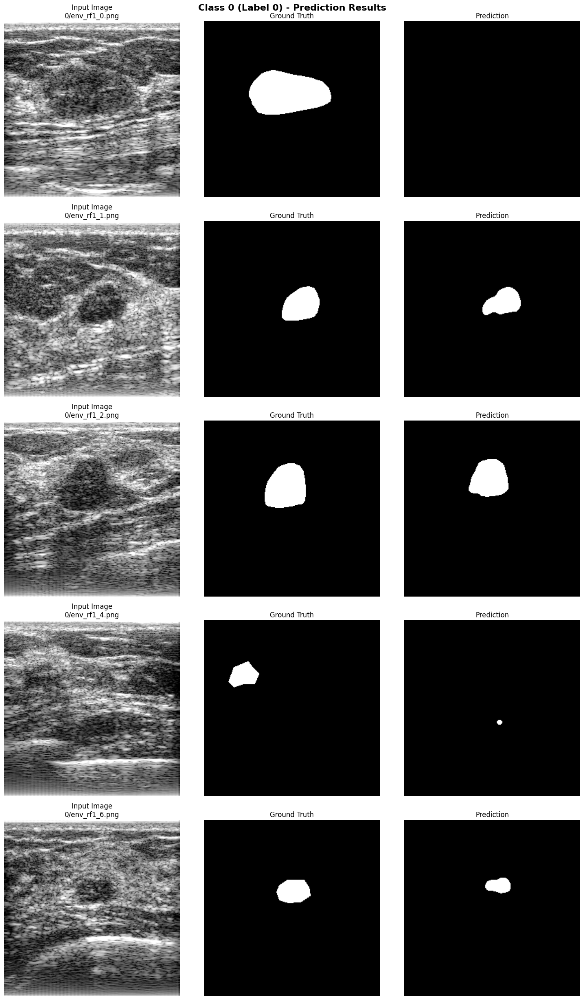

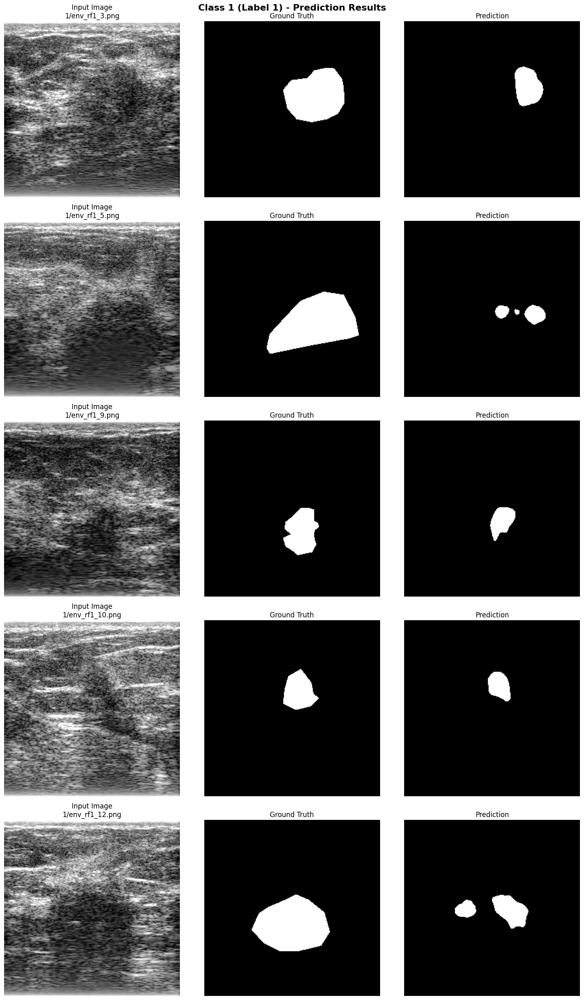

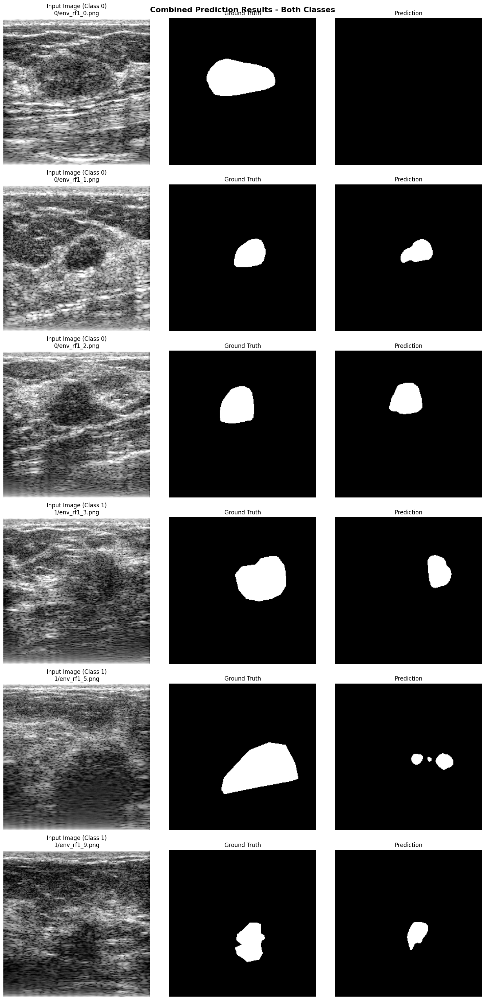

In [6]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from natsort import natsorted
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Configuration
IMG_SIZE = (256, 256)
BATCH_SIZE = 8
MODEL_PATH = "best_model_seg_NEW.pth"
DATA_PATH = "output_images/"
LABELS = ["0", "1"]
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dataset class
class UltrasoundTestDataset(Dataset):
    def __init__(self, data_path):
        self.rf_images = []
        self.roi_masks = []
        self.file_names = []
        self.labels = []  # Store labels for each sample
        valid_extensions = ('.png', '.jpg', '.jpeg')
        
        for label in LABELS:
            rf_path = os.path.join(data_path, label, "rf")
            roi_path = os.path.join(data_path, label, "roi")
            if not os.path.exists(rf_path) or not os.path.exists(roi_path):
                continue

            rf_files = natsorted([f for f in os.listdir(rf_path) if f.lower().endswith(valid_extensions)])
            roi_files = natsorted([f for f in os.listdir(roi_path) if f.lower().endswith(valid_extensions)])
            
            for rf_file, roi_file in zip(rf_files, roi_files):
                rf_img = cv2.imread(os.path.join(rf_path, rf_file), cv2.IMREAD_GRAYSCALE)
                roi_img = cv2.imread(os.path.join(roi_path, roi_file), cv2.IMREAD_GRAYSCALE)
                if rf_img is None or roi_img is None:
                    continue
                rf_img = cv2.resize(rf_img, IMG_SIZE)
                roi_img = cv2.resize(roi_img, IMG_SIZE)
                roi_img = (roi_img > 127).astype(np.float32)
                self.rf_images.append(rf_img)
                self.roi_masks.append(roi_img)
                self.file_names.append(f"{label}/{rf_file}")
                self.labels.append(int(label))  # Store the label

    def __len__(self):
        return len(self.rf_images)

    def __getitem__(self, idx):
        img = torch.tensor(self.rf_images[idx], dtype=torch.float32).unsqueeze(0) / 255.0
        mask = torch.tensor(self.roi_masks[idx], dtype=torch.float32).unsqueeze(0)
        return img, mask, self.file_names[idx], self.labels[idx]

# U-Net
class ImprovedUNet(nn.Module):
    def __init__(self):
        super(ImprovedUNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(1, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)
        self.enc4 = conv_block(256, 512)
        self.pool = nn.MaxPool2d(2)

        self.up4 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec4 = conv_block(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec3 = conv_block(256, 128)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec2 = conv_block(128, 64)

        self.final = nn.Sequential(
            nn.Conv2d(64, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        d4 = self.up4(e4)
        d4 = torch.cat([d4, e3], dim=1)
        d4 = self.dec4(d4)

        d3 = self.up3(d4)
        d3 = torch.cat([d3, e2], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e1], dim=1)
        d2 = self.dec2(d2)

        return self.final(d2)

# Metric function
def calculate_metrics(TP, TN, FP, FN):
    eps = 1e-10
    return {
        'Accuracy': (TP + TN) / (TP + TN + FP + FN + eps),
        'Recall/Sensitivity': TP / (TP + FN + eps),
        'Specificity': TN / (TN + FP + eps),
        'Precision': TP / (TP + FP + eps),
        'F1-Score': (2 * TP) / (2 * TP + FP + FN + eps),
        'Dice': (2 * TP) / (2 * TP + FP + FN + eps),
        'IoU/Jaccard': TP / (TP + FP + FN + eps)
    }

# Enhanced Visualization for both labels
def visualize_predictions_by_class(images, masks, predictions, filenames, labels, num_samples_per_class=5):
    """Visualize predictions separately for each class (label 0 and label 1)"""
    
    # Separate samples by class
    class_0_indices = [i for i, label in enumerate(labels) if label == 0]
    class_1_indices = [i for i, label in enumerate(labels) if label == 1]
    
    # Limit samples per class
    class_0_indices = class_0_indices[:num_samples_per_class]
    class_1_indices = class_1_indices[:num_samples_per_class]
    
    # Create visualization for Class 0
    if class_0_indices:
        plt.figure(figsize=(15, 5 * len(class_0_indices)))
        plt.suptitle("Class 0 (Label 0) - Prediction Results", fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(class_0_indices):
            plt.subplot(len(class_0_indices), 3, i*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(len(class_0_indices), 3, i*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(len(class_0_indices), 3, i*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')

        plt.tight_layout()
        plt.savefig("prediction_results_class_0.png", dpi=150, bbox_inches='tight')
        plt.show()
    
    # Create visualization for Class 1
    if class_1_indices:
        plt.figure(figsize=(15, 5 * len(class_1_indices)))
        plt.suptitle("Class 1 (Label 1) - Prediction Results", fontsize=16, fontweight='bold')
        
        for i, idx in enumerate(class_1_indices):
            plt.subplot(len(class_1_indices), 3, i*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(len(class_1_indices), 3, i*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(len(class_1_indices), 3, i*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')

        plt.tight_layout()
        plt.savefig("prediction_results_class_1.png", dpi=150, bbox_inches='tight')
        plt.show()

# Combined visualization (original + enhanced)
def visualize_combined_results(images, masks, predictions, filenames, labels, num_samples_per_class=3):
    """Create a combined visualization showing both classes side by side"""
    
    # Get samples from each class
    class_0_indices = [i for i, label in enumerate(labels) if label == 0][:num_samples_per_class]
    class_1_indices = [i for i, label in enumerate(labels) if label == 1][:num_samples_per_class]
    
    total_samples = len(class_0_indices) + len(class_1_indices)
    
    if total_samples > 0:
        plt.figure(figsize=(15, 5 * total_samples))
        plt.suptitle("Combined Prediction Results - Both Classes", fontsize=16, fontweight='bold')
        
        current_row = 0
        
        # Plot Class 0 samples
        for idx in class_0_indices:
            plt.subplot(total_samples, 3, current_row*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image (Class 0)\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')
            
            current_row += 1
        
        # Plot Class 1 samples
        for idx in class_1_indices:
            plt.subplot(total_samples, 3, current_row*3 + 1)
            plt.imshow(images[idx].squeeze(), cmap='gray')
            plt.title(f"Input Image (Class 1)\n{filenames[idx]}")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 2)
            plt.imshow(masks[idx].squeeze(), cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')

            plt.subplot(total_samples, 3, current_row*3 + 3)
            plt.imshow(predictions[idx].squeeze(), cmap='gray')
            plt.title("Prediction")
            plt.axis('off')
            
            current_row += 1

        plt.tight_layout()
        plt.savefig("prediction_results_combined.png", dpi=150, bbox_inches='tight')
        plt.show()

# Save individual predictions to folders
def save_predictions_to_folders(images, masks, predictions, filenames, labels, output_dir="prediction_outputs"):
    """Save individual predictions organized by class labels"""
    
    # Create main output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Create subdirectories for each class
    class_0_dir = os.path.join(output_dir, "class_0_predictions")
    class_1_dir = os.path.join(output_dir, "class_1_predictions")
    
    os.makedirs(class_0_dir, exist_ok=True)
    os.makedirs(class_1_dir, exist_ok=True)
    
    # Create subdirectories for input, ground truth, and predictions
    for class_dir in [class_0_dir, class_1_dir]:
        os.makedirs(os.path.join(class_dir, "input_images"), exist_ok=True)
        os.makedirs(os.path.join(class_dir, "ground_truth"), exist_ok=True)
        os.makedirs(os.path.join(class_dir, "predictions"), exist_ok=True)
    
    # Save images based on their labels
    for i, (img, mask, pred, filename, label) in enumerate(zip(images, masks, predictions, filenames, labels)):
        # Convert tensors to numpy arrays
        img_np = (img.squeeze().numpy() * 255).astype(np.uint8)
        mask_np = (mask.squeeze().numpy() * 255).astype(np.uint8)
        pred_np = (pred.squeeze().numpy() * 255).astype(np.uint8)
        
        # Extract base filename without path
        base_filename = os.path.basename(filename).split('.')[0]
        
        # Determine target directory based on label
        if label == 0:
            target_dir = class_0_dir
            class_name = "class_0"
        else:
            target_dir = class_1_dir
            class_name = "class_1"
        
        # Save input image
        input_path = os.path.join(target_dir, "input_images", f"{base_filename}_input.png")
        cv2.imwrite(input_path, img_np)
        
        # Save ground truth mask
        gt_path = os.path.join(target_dir, "ground_truth", f"{base_filename}_gt.png")
        cv2.imwrite(gt_path, mask_np)
        
        # Save prediction
        pred_path = os.path.join(target_dir, "predictions", f"{base_filename}_pred.png")
        cv2.imwrite(pred_path, pred_np)
        
        # Create a combined visualization for each sample
        combined_img = np.hstack([img_np, mask_np, pred_np])
        combined_path = os.path.join(target_dir, f"{base_filename}_combined.png")
        cv2.imwrite(combined_path, combined_img)
    
    print(f"\nPredictions saved to folders:")
    print(f"- Class 0 predictions: {class_0_dir}")
    print(f"- Class 1 predictions: {class_1_dir}")
    
    # Count and report saved files
    class_0_count = len([f for f in os.listdir(os.path.join(class_0_dir, "input_images")) if f.endswith('.png')])
    class_1_count = len([f for f in os.listdir(os.path.join(class_1_dir, "input_images")) if f.endswith('.png')])
    
    print(f"- Class 0: {class_0_count} samples saved")
    print(f"- Class 1: {class_1_count} samples saved")

# Save results
def save_results(metrics, cm, class_metrics, save_path="test_results.txt"):
    with open(save_path, "w") as f:
        f.write("==== SEGMENTATION TEST RESULTS ====\n\n")
        f.write("=== Overall Metrics ===\n")
        for metric_name, value in metrics.items():
            f.write(f"{metric_name}: {value:.4f}\n")

        f.write("\n=== Confusion Matrix ===\n")
        f.write(f"TN: {cm[0, 0]}, FP: {cm[0, 1]}\n")
        f.write(f"FN: {cm[1, 0]}, TP: {cm[1, 1]}\n")

        f.write("\n=== Per-Class Metrics ===\n")
        for label, metrics_dict in class_metrics.items():
            f.write(f"Class {label}:\n")
            for metric_name, value in metrics_dict.items():
                f.write(f"  {metric_name}: {value:.4f}\n")

# Evaluation
def evaluate():
    dataset = UltrasoundTestDataset(DATA_PATH)
    loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False)

    model = ImprovedUNet().to(device)
    model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
    model.eval()

    all_preds, all_masks, all_imgs, filenames, all_labels = [], [], [], [], []
    TP = TN = FP = FN = 0

    with torch.no_grad():
        for imgs, masks, fnames, batch_labels in loader:
            imgs = imgs.to(device)
            masks = masks.to(device)
            preds = model(imgs)
            preds_bin = (preds > 0.5).float()

            TP += torch.sum((preds_bin == 1) & (masks == 1)).item()
            TN += torch.sum((preds_bin == 0) & (masks == 0)).item()
            FP += torch.sum((preds_bin == 1) & (masks == 0)).item()
            FN += torch.sum((preds_bin == 0) & (masks == 1)).item()

            all_preds.extend(preds_bin.cpu())
            all_masks.extend(masks.cpu())
            all_imgs.extend(imgs.cpu())
            filenames.extend(fnames)
            all_labels.extend(batch_labels.tolist())

    metrics = calculate_metrics(TP, TN, FP, FN)
    cm = confusion_matrix(torch.cat(all_masks).view(-1), torch.cat(all_preds).view(-1))
    class_metrics = {
        'Positive (1)': calculate_metrics(TP, TN, FP, FN),
        'Negative (0)': calculate_metrics(TN, TP, FN, FP)
    }

    save_results(metrics, cm, class_metrics)
    
    # Enhanced visualization with separate plots for each class
    print("Generating visualizations...")
    print(f"Total samples: {len(all_imgs)}")
    print(f"Class 0 samples: {sum(1 for label in all_labels if label == 0)}")
    print(f"Class 1 samples: {sum(1 for label in all_labels if label == 1)}")
    
    # Save individual predictions to organized folders
    print("\nSaving individual predictions to folders...")
    save_predictions_to_folders(all_imgs, all_masks, all_preds, filenames, all_labels)
    
    # Visualize predictions separately for each class
    visualize_predictions_by_class(all_imgs, all_masks, all_preds, filenames, all_labels, num_samples_per_class=5)
    
    # Also create a combined visualization
    visualize_combined_results(all_imgs, all_masks, all_preds, filenames, all_labels, num_samples_per_class=3)

if __name__ == "__main__":
    evaluate()